## Mount Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Imports

In [0]:
import sys
sys.path.extend(['/content/drive/My Drive/VolumMedSeg', '/content/drive/My Drive/VolumMedSeg/src'])

import pickle
import numpy as np
import nibabel as nib
import seaborn as sns
import pandas as pd
from tensorflow.keras.models import load_model
from matplotlib import animation, rc
from matplotlib import pyplot as plt

from src.visualization import animate_scan
from src.metrics import dice_coefficient, recall, precision, mean_dice, mean_iou
from src.losses import soft_dice_loss
from src.utils import stack_2D_2_3D, load_sample, evaluate, get_data_paths4existing_slit, get_fpaths, get_dataset_split, unpack_2D_fpaths, get_2D_sep_slices

rc('animation', html='jshtml')

## Loading Data


### Load 3D data paths


In [0]:
data3D_dir = '/content/drive/My Drive/BTATS2019_preprocessed/3D'
data3D_paths = get_fpaths(data3D_dir)
_, _, val_data3D_paths = get_dataset_split(data3D_paths, seed=42)

In [0]:
val_data3D_paths

### Load 2D data paths

In [0]:
data2D_dir = '/content/drive/My Drive/BTATS2019_preprocessed/2D/'

In [0]:
val_data2D_paths = get_data_paths4existing_slit(data2D_dir, val_data3D_paths, mode="2D")

In [0]:
val_data2D_paths_unnpacked = unpack_2D_fpaths(val_data2D_paths, only_with_mask=False)

In [0]:
val_data2D_paths_unnpacked

# Explore models

### Init model variables

In [0]:
BATCH_SIZE = 1
MERGE_CLASSES = True
OUTPUT_CLASSES = ['ncr', 'et', 'ed']
SCAN_TYPES = ['t1', 't1ce', 't2', 'flair']
DIM3D = (144, 192, 160)
DIM2D = (192, 160)

n_classes = len(OUTPUT_CLASSES) if not MERGE_CLASSES else 1
n_channels = len(SCAN_TYPES)
custom_objects = {'soft_dice_loss': soft_dice_loss, 'mean_iou': mean_iou}

In [0]:
model_3DUnet_path = '/content/drive/My Drive/VolumMedSeg/models/BraTS/tmp/Unet3D.h5'
model_history_3DUnet_path = '/content/drive/My Drive/VolumMedSeg/models/BraTS/tmp/Unet3D_history.pkl'

model_Dilated3DUnet_path = '/content/drive/My Drive/VolumMedSeg/models/BraTS/UNet3DDilated/Unet3DDilated.h5'
model_history_Dilated3DUnet_path = '/content/drive/My Drive/VolumMedSeg/models/BraTS/UNet3DDilated/Unet3DDilated_history.pkl'

model_2DUnet_path = '/content/drive/My Drive/VolumMedSeg/models/BraTS/UNet2D/Unet2D.h5'
model_history_2DUnet_path = '/content/drive/My Drive/VolumMedSeg/models/BraTS/UNet2D/Unet2D_history.pkl'

model_Dilated2DUnet_path = '/content/drive/My Drive/VolumMedSeg/models/BraTS/UNet2DDilated/Unet2DDilated.h5'
model_history_Dilated2DUnet_path =  '/content/drive/My Drive/VolumMedSeg/models/BraTS/UNet2DDilated/Unet2DDilated_history.pkl'

### 3D U-Net

#### Create 3D data generators

In [0]:
val3D_params = {
          'dim': DIM3D,
          'batch_size': BATCH_SIZE,
          'merge_classes': MERGE_CLASSES,
          'scan_types': SCAN_TYPES,
          'output_classes': OUTPUT_CLASSES,
          }


validation3D_generator = Med3DDataGenerator(val_data3D_paths, **val3D_params)

#### 3D U-Net model

In [0]:
model_3D = load_model(model_3DUnet_path, custom_objects=custom_objects)

In [0]:
prediction_UNet3D = model_3D.predict(validation3D_generator, verbose=1)

In [0]:
scores_3D = evaluate(val_data3D_paths, prediction_UNet3D, mean_dice, DIM3D, SCAN_TYPES, OUTPUT_CLASSES, MERGE_CLASSES, mode="3D")

#### Dilated 3D U-Net model

In [0]:
model_3D_dil = load_model(model_Dilated3DUnet_path, custom_objects=custom_objects)

In [0]:
prediction_UNet3D_dil = model_3D_dil.predict(validation3D_generator, verbose=1)

In [0]:
scores_3D_dil = evaluate(val_data3D_paths, prediction_UNet3D_dil, mean_dice, DIM3D, SCAN_TYPES, OUTPUT_CLASSES, MERGE_CLASSES, mode="3D")

### 2D U-Net

#### Create 2D data generators

In [0]:
val2D_params = {
          'dim': DIM2D,
          'batch_size': BATCH_SIZE,
          'merge_classes': MERGE_CLASSES,
          'scan_types': SCAN_TYPES,
          'output_classes': OUTPUT_CLASSES,
          }


validation2D_generator = Med2DDataGenerator(val_data2D_paths_unnpacked, **val2D_params)

In [0]:
samples_sep = get_2D_sep_slices(val_data2D_paths_unnpacked)

#### 2D U-Net model

In [0]:
model2D = load_model(model_2DUnet_path, custom_objects=custom_objects)

In [0]:
prediction_UNet2D = model2D.predict(validation2D_generator, verbose=1)

In [0]:
stacked_pred = stack_2D_2_3D(samples_sep, prediction_UNet2D, DIM3D,  n_classes)

In [0]:
scores_2D = evaluate(val_data2D_paths, stacked_pred, mean_iou, DIM3D, SCAN_TYPES, OUTPUT_CLASSES, MERGE_CLASSES, mode="2D")

#### Dilated 2D U-Net model

In [0]:
model_Dilated2D  = load_model(model_Dilated2DUnet_path, custom_objects=custom_objects)

In [0]:
prediction_UNetDilated2D = model_Dilated2D.predict(validation2D_generator, verbose=1)

In [0]:
stacked_pred_dil = stack_2D_2_3D(samples_sep, prediction_UNetDilated2D, DIM3D, n_classes)

In [0]:
scores_2D_dil = evaluate(val_data2D_paths, stacked_pred_dil, mean_iou, DIM3D, SCAN_TYPES, OUTPUT_CLASSES, MERGE_CLASSES, mode="2D")

## Visualization

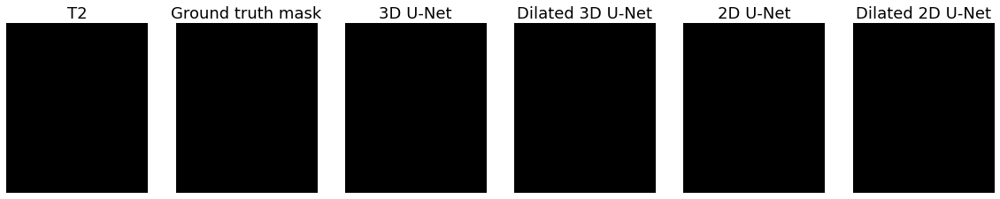

In [52]:
mask, modalities = load_sample(val_data3D_paths[50], DIM3D, SCAN_TYPES, OUTPUT_CLASSES, MERGE_CLASSES, mode="3D")

u_net_3d = prediction_UNet3D[50][:,:,:,0] >= 0.5
u_net_2d = stacked_pred[50][:,:,:,0] >= 0.5
u_net_3d_dil = prediction_UNet3D_dil[50][:,:,:,0] >= 0.5
u_net_2d_dil = stacked_pred_dil[50][:,:,:,0] >= 0.5

anim = animate_scan([modalities[:,:,:,3], mask[:,:,:,0], u_net_3d, u_net_3d_dil, u_net_2d, u_net_2d_dil], 
                    ['T2', 'Ground truth mask', '3D U-Net', 'Dilated 3D U-Net', '2D U-Net', 'Dilated 2D U-Net'],
                    (20, 12))
anim

### Loss

In [0]:
with open(model_history_3DUnet_path, 'rb') as f:
      history_3D_UNet = pickle.load(f)

with open(model_history_Dilated3DUnet_path, 'rb') as f:
      history_3D_Dil_UNet = pickle.load(f)

with open(model_history_2DUnet_path, 'rb') as f:
      history_2D_UNet = pickle.load(f)

with open(model_history_Dilated2DUnet_path, 'rb') as f:
      history_2D_Dil_UNet = pickle.load(f)

In [0]:
epochs = range(1, 51)
legends = ['3D U-Net Training Loss', '3D U-Net Test Loss', 'Dilated 3D U-Net Training Loss', 'Dilated 3D U-Net Test Loss', '2D U-Net Training Loss', '2D U-Net Test Loss', 'Dilated 2D U-Net Test Loss', 'Dilated 2D U-Net Training Loss']

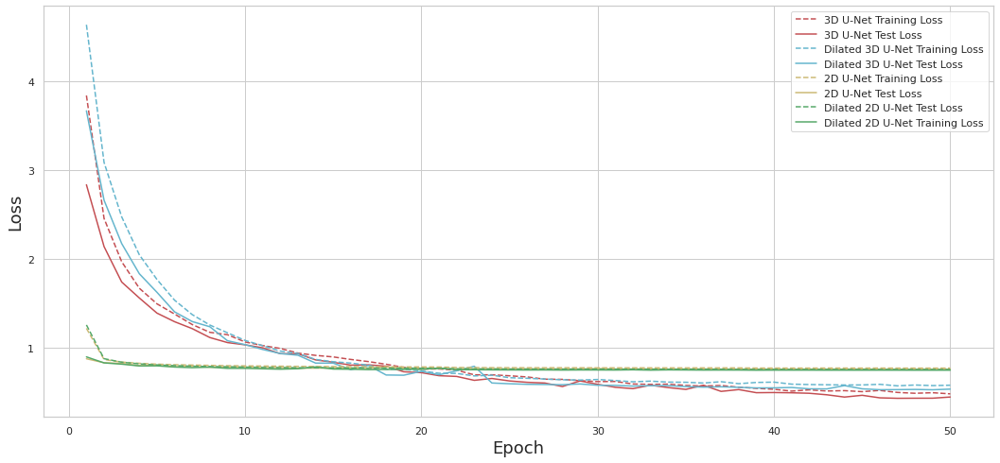

In [88]:
sns.set(style="whitegrid")

plt.figure(figsize=(18, 8))
plt.plot(epochs, history_3D_UNet['loss'][:50], 'r--')
plt.plot(epochs, history_3D_UNet['val_loss'][:50], 'r-')
plt.plot(epochs, history_3D_Dil_UNet['loss'][:50], 'c--')
plt.plot(epochs, history_3D_Dil_UNet['val_loss'][:50], 'c-')
plt.plot(epochs, history_2D_UNet['loss'][:50], 'y--')
plt.plot(epochs, history_2D_UNet['val_loss'][:50], 'y-')
plt.plot(epochs, history_2D_Dil_UNet['loss'][:50], 'g--')
plt.plot(epochs, history_2D_Dil_UNet['val_loss'][:50], 'g-')
plt.legend(legends)
plt.xlabel('Epoch', fontsize=18)
plt.ylabel('Loss', fontsize=18)
plt.show();

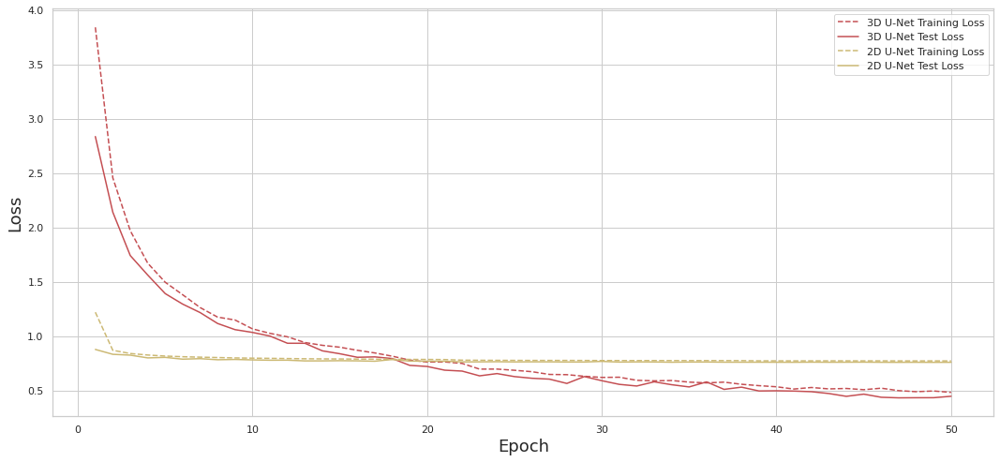

In [82]:
sns.set(style="whitegrid")
legends = ['3D U-Net Training Loss', '3D U-Net Test Loss', '2D U-Net Training Loss', '2D U-Net Test Loss']
plt.figure(figsize=(18, 8))
plt.plot(epochs, history_3D_UNet['loss'][:50], 'r--')
plt.plot(epochs, history_3D_UNet['val_loss'][:50], 'r-')
plt.plot(epochs, history_2D_UNet['loss'][:50], 'y--')
plt.plot(epochs, history_2D_UNet['val_loss'][:50], 'y-')
plt.legend(legends)
plt.xlabel('Epoch', fontsize=18)
plt.ylabel('Loss', fontsize=18)
plt.show();

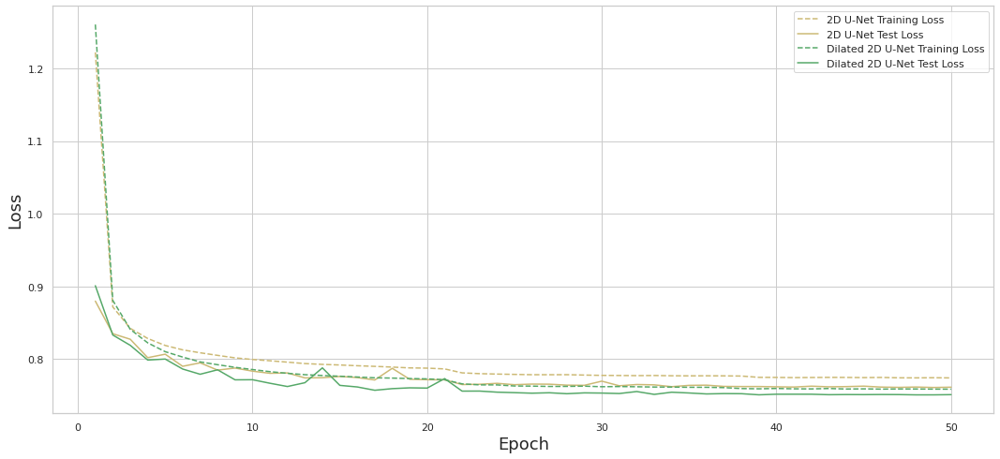

In [83]:
sns.set(style="whitegrid")
legends = ['2D U-Net Training Loss', '2D U-Net Test Loss', 'Dilated 2D U-Net Training Loss', 'Dilated 2D U-Net Test Loss']

plt.figure(figsize=(18, 8))
plt.plot(epochs, history_2D_UNet['loss'][:50], 'y--')
plt.plot(epochs, history_2D_UNet['val_loss'][:50], 'y-')
plt.plot(epochs, history_2D_Dil_UNet['loss'][:50], 'g--')
plt.plot(epochs, history_2D_Dil_UNet['val_loss'][:50], 'g-')
plt.legend(legends)
plt.xlabel('Epoch', fontsize=18)
plt.ylabel('Loss', fontsize=18)
plt.show();

### Dice Score

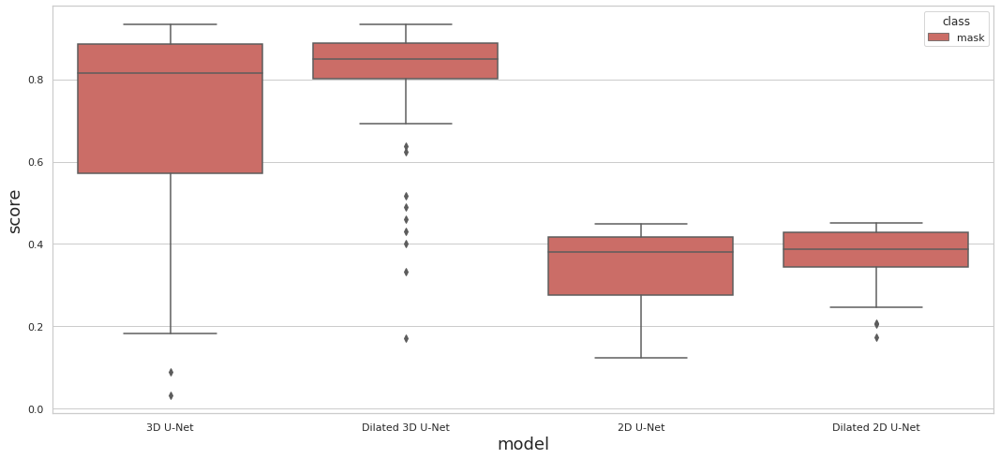

In [86]:
scores_3D['model'] = ['3D U-Net' for _ in range(len(scores_3D['score']))]
df_3D_U_Net = pd.DataFrame.from_dict(scores_3D)
scores_3D_dil['model'] = ['Dilated 3D U-Net' for _ in range(len(scores_3D['score']))]
df_3D_Dil_U_Net = pd.DataFrame.from_dict(scores_3D_dil)
scores_2D['model'] = ['2D U-Net' for _ in range(len(scores_2D['score']))]
df_2D_U_Net = pd.DataFrame.from_dict(scores_2D)
scores_2D_dil['model'] = ['Dilated 2D U-Net' for _ in range(len(scores_2D_dil['score']))]
df_2D_Dil_U_Net = pd.DataFrame.from_dict(scores_2D_dil)

df_models = pd.concat([df_3D_U_Net, df_3D_Dil_U_Net, df_2D_U_Net, df_2D_Dil_U_Net])

plt.figure(figsize=(18, 8))
plt.xlabel('score', fontsize=18)
plt.ylabel('model', fontsize=18)
sns.boxplot(x="model", y="score", hue="class", data=df_models, palette="hls")